## Import Libraries

In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm

pd.options.plotting.backend = 'plotly'

import plotly.io as pio
pio.renderers.default = "notebook_connected"

import matplotlib.pyplot as plt
import matplotlib.image as img
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

## Loading the data

In [2]:
train_df = pd.read_csv('../data/AnomalyDetection/train_df.csv')
test_df = pd.read_csv('../data/AnomalyDetection/test_df.csv')

In [3]:
display(train_df.shape, train_df.head())

(4277, 5)

,index,file_name,class,state,label
0,0,10000.png,transistor,good,transistor-good
1,1,10001.png,capsule,good,capsule-good
2,2,10002.png,transistor,good,transistor-good
3,3,10003.png,wood,good,wood-good
4,4,10004.png,bottle,good,bottle-good


In [4]:
display(test_df.shape, test_df.head())

(2154, 2)

,index,file_name
0,0,20000.png
1,1,20001.png
2,2,20002.png
3,3,20003.png
4,4,20004.png


In [5]:
classList = train_df['class'].unique()
stateList = train_df['state'].unique()
labelList = train_df['label'].unique()
print(f"class의 수: {len(classList)}")
print(f"state의 수: {len(stateList)}")
print(f"label의 수: {len(labelList)}")

class의 수: 15
state의 수: 49
label의 수: 88


# 
# 
## Distributions

### Class

In [6]:
data = train_df.groupby(['class']).size().sort_values(ascending=False).reset_index(name='cnt')
fig = px.bar(data, x='class', y='cnt', color_discrete_sequence=px.colors.qualitative.Dark24_r[:],
            color='class', text=['%d(%d%%)' %(int(a), b) for a,b in zip(data['cnt'].values, data['cnt'].values/data['cnt'].sum()*100)])
fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig.show()

### 
### State

In [7]:
df_agg = train_df.groupby(['class', 'state']).size()
g = df_agg.groupby('class', group_keys=False)
df_agg = g.apply(lambda x: x.sort_values(ascending=False)).reset_index(name='cnt')
df_agg['state'] = np.where(df_agg['state'] == 'good', df_agg['class'], df_agg['state'])

In [8]:
fig = px.bar(df_agg, x='state', y='cnt', color='class', color_discrete_sequence=px.colors.qualitative.Dark24_r,)
fig.update_layout(xaxis = dict(tickfont=dict(family='Geogia', size=10)))
fig.show()

# 
## Images

### Class

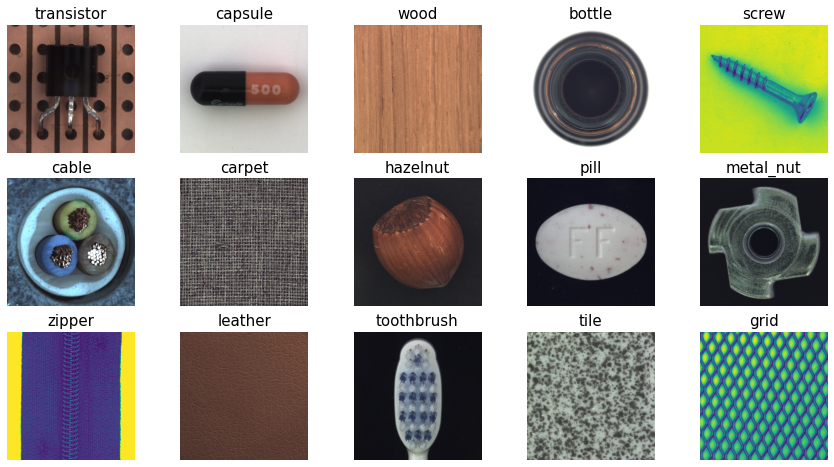

In [9]:
fig, axs = plt.subplots(3, 5, figsize=(15, 8))

fDir = '../data/AnomalyDetection/train/'

for i, c in enumerate(classList):
    image = img.imread(fDir + train_df[train_df['class'] == c]['file_name'].sample(1).iloc[0])
    axs[i//5, i%5].imshow(image)
    axs[i//5, i%5].set_title(c, fontsize=15)
    axs[i//5, i%5].axis('off')
plt.show()

### 
### State

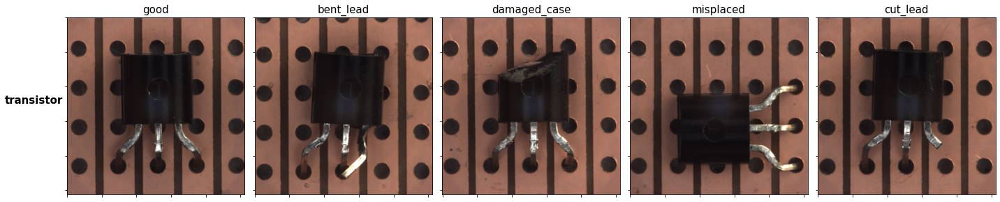

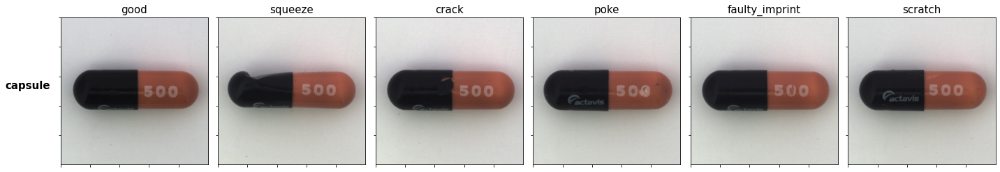

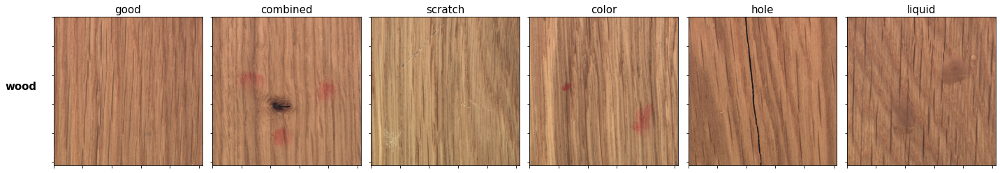

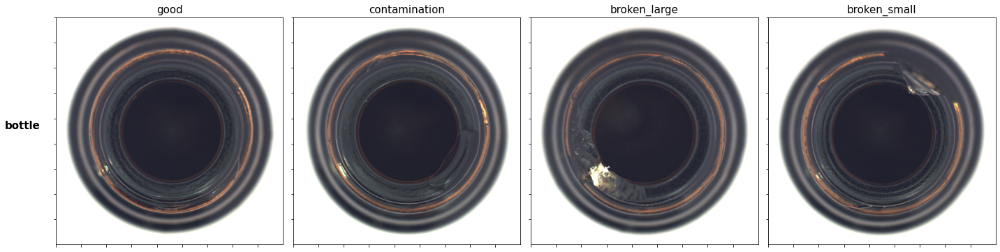

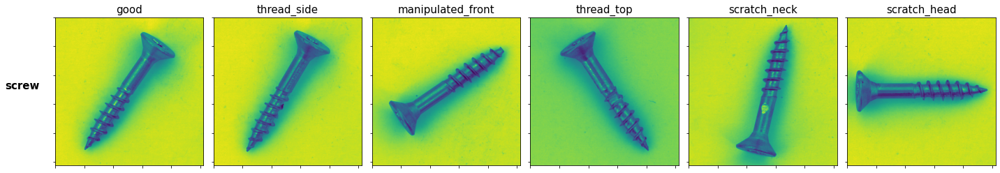

...

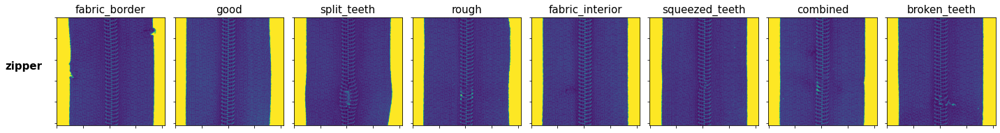

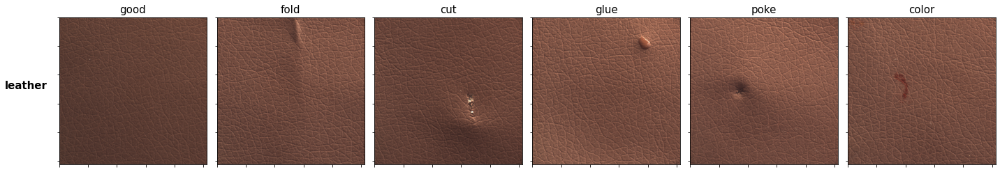

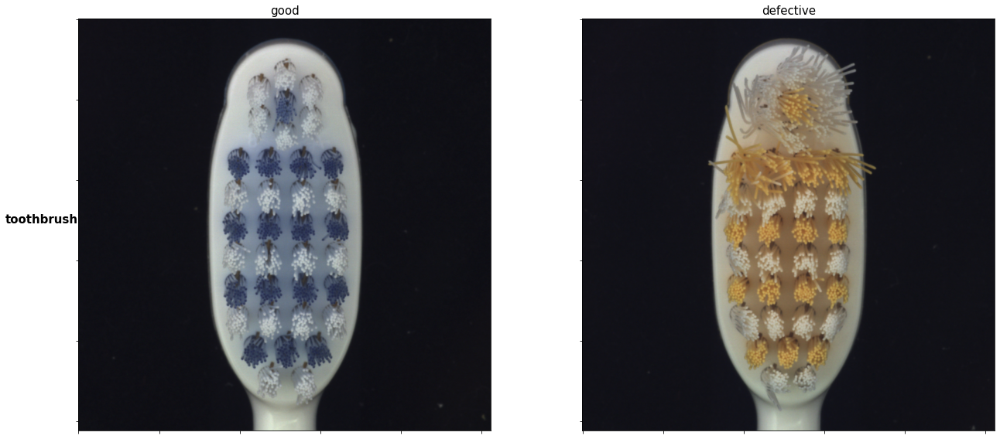

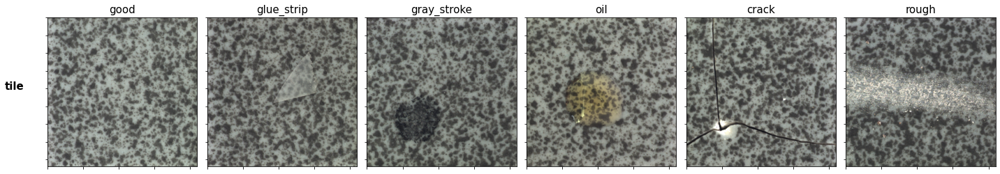

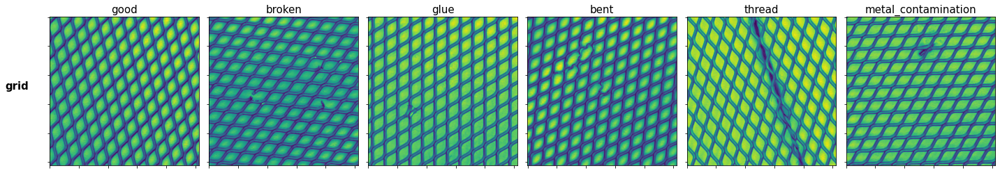

In [10]:
for c in classList:
    tmp = train_df.loc[train_df['class'] == c]
    states = train_df.loc[train_df['class'] == c, 'state'].unique()
    
    fig, axs = plt.subplots(1, len(states), figsize=(20,8))
    
    for idx, s in enumerate(states):
        imgDir = tmp.loc[tmp['state'] == s , 'file_name'].sample(1).iloc[0]
        image = img.imread(fDir + imgDir)
        axs[idx].imshow(image)
        axs[idx].set_xticklabels([])
        axs[idx].set_yticklabels([])
        
    for ax, col in zip(axs, states):
        ax.set_title(col, size=15)

    axs[0].set_ylabel(c, rotation=0, fontsize=15, labelpad=40, fontdict=dict(weight='bold'))

    fig.tight_layout()
    plt.show()
    print('\n\n')